In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/sunflower-development-stages/Sunflower_Stages.npy
/kaggle/input/sunflower-development-stages/Sunflower_Stages_Labels.npy


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter
import tensorflow as tf
from sklearn.model_selection import train_test_split

Dataset shape: (12800, 224, 224, 3)
Labels shape: (12800, 1)


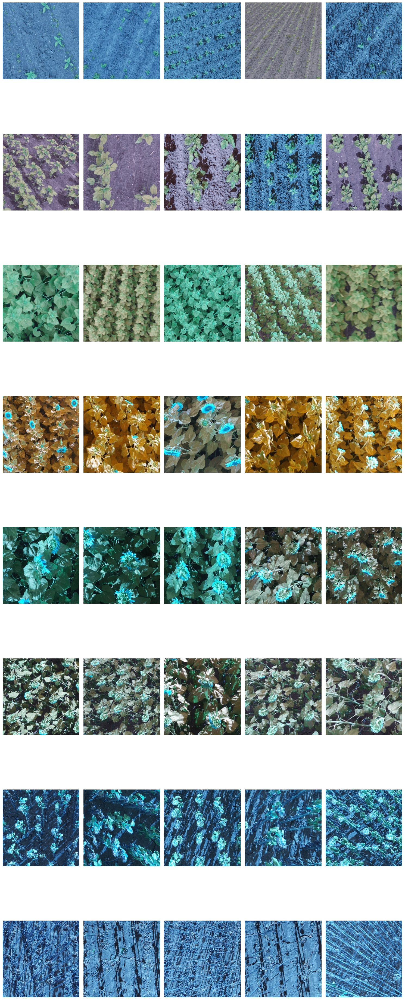

In [3]:

# Load the dataset and labels
dataset = np.load('/kaggle/input/sunflower-development-stages/Sunflower_Stages.npy')
labels = np.load('/kaggle/input/sunflower-development-stages/Sunflower_Stages_Labels.npy')

# Inspect the shape of the dataset and labels
print(f"Dataset shape: {dataset.shape}")
print(f"Labels shape: {labels.shape}")

# Get unique labels
unique_labels = np.unique(labels)

# Number of images to display per label
images_per_label = 5

# Create a plot to display images
plt.figure(figsize=(15, len(unique_labels) * 5))  # Adjust figure size for multiple labels

# Loop through each unique label
for idx, label in enumerate(unique_labels):
    # Get indices of images for the current label
    label_indices = np.where(labels == label)[0]
    
    # Select the first few images for this label
    selected_indices = label_indices[:images_per_label]
    
    for j, img_idx in enumerate(selected_indices):
        plt.subplot(len(unique_labels), images_per_label, idx * images_per_label + j + 1)
        plt.imshow(dataset[img_idx])
        plt.axis('off')
        if j == 0:  # Add label title for the first image in each row
            plt.ylabel(f"Label {label}", fontsize=12, labelpad=10)

plt.tight_layout()
plt.show()



Unique Labels and Counts:
Label 0: 1600 instances
Label 1: 1600 instances
Label 2: 1600 instances
Label 3: 1600 instances
Label 4: 1600 instances
Label 5: 1600 instances
Label 6: 1600 instances
Label 7: 1600 instances


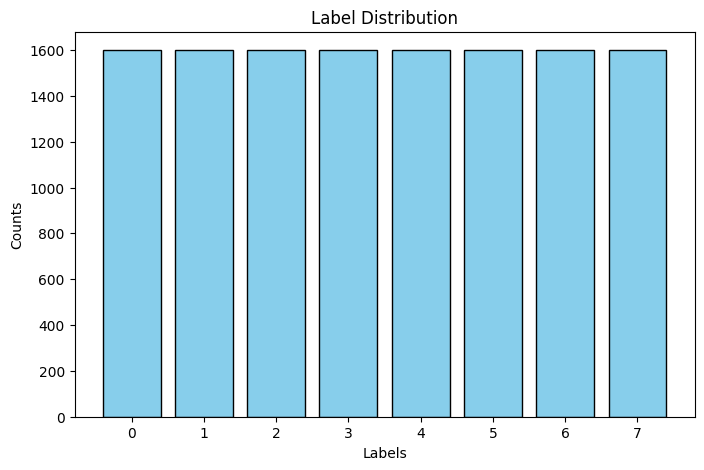

In [4]:


# Load the labels
labels = np.load('/kaggle/input/sunflower-development-stages/Sunflower_Stages_Labels.npy')

# Get the unique labels and their counts
unique_labels, counts = np.unique(labels, return_counts=True)

# Display the unique labels and their counts
print("Unique Labels and Counts:")
for label, count in zip(unique_labels, counts):
    print(f"Label {label}: {count} instances")

# Visualize the label distribution
plt.figure(figsize=(8, 5))
plt.bar(unique_labels, counts, color='skyblue', edgecolor='black')
plt.title("Label Distribution")
plt.xlabel("Labels")
plt.ylabel("Counts")
plt.xticks(unique_labels)  # Show labels as x-axis ticks
plt.show()


In [6]:

# Load the dataset and labels (make sure these are already loaded)
dataset = np.load('/kaggle/input/sunflower-development-stages/Sunflower_Stages.npy')
labels = np.load('/kaggle/input/sunflower-development-stages/Sunflower_Stages_Labels.npy')

# Convert the dataset to a TensorFlow Dataset
tf_dataset = tf.data.Dataset.from_tensor_slices((dataset, labels))

# Preprocessing function to normalize the images
def preprocess(image, label):
    image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1]
    return image, label

# Apply preprocessing, shuffle, and batch the dataset
tf_dataset = (tf_dataset
              .map(preprocess)  # Apply preprocessing
              .shuffle(buffer_size=1000)  # Shuffle the dataset
              .batch(32)  # Batch the data
              .prefetch(buffer_size=tf.data.AUTOTUNE))  # Optimize pipeline

# Extract images and labels into numpy arrays
images = []
labels_list = []

# Iterate through the dataset to collect the images and labels
for image, label in tf_dataset:
    images.append(image.numpy())
    labels_list.append(label.numpy())

# Convert lists to numpy arrays
images = np.concatenate(images, axis=0)
labels = np.concatenate(labels_list, axis=0)

# Split the dataset into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(images, labels, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.33, random_state=42)  # 0.33 of 0.3 = 0.1

# Convert the NumPy arrays back to tf.data.Dataset
train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
test_dataset = tf.data.Dataset.from_tensor_slices((X_test, y_test))

# Apply preprocessing, batching, and optimization to each dataset
train_dataset = (train_dataset
                 .map(preprocess)
                 .shuffle(buffer_size=1000)
                 .batch(32)
                 .prefetch(buffer_size=tf.data.AUTOTUNE))

val_dataset = (val_dataset
               .map(preprocess)
               .batch(32)
               .prefetch(buffer_size=tf.data.AUTOTUNE))

test_dataset = (test_dataset
                .map(preprocess)
                .batch(32)
                .prefetch(buffer_size=tf.data.AUTOTUNE))

# Verify the split dataset structure
print(f"Training set size: {len(X_train)}")
print(f"Validation set size: {len(X_val)}")
print(f"Test set size: {len(X_test)}")

# Now you can use train_dataset, val_dataset, and test_dataset for model training and evaluation


I0000 00:00:1736449301.438891      10 service.cc:145] XLA service 0x595c3751e450 initialized for platform TPU (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1736449301.438957      10 service.cc:153]   StreamExecutor device (0): TPU, 2a886c8
I0000 00:00:1736449301.438962      10 service.cc:153]   StreamExecutor device (1): TPU, 2a886c8
I0000 00:00:1736449301.438965      10 service.cc:153]   StreamExecutor device (2): TPU, 2a886c8
I0000 00:00:1736449301.438968      10 service.cc:153]   StreamExecutor device (3): TPU, 2a886c8
I0000 00:00:1736449301.438971      10 service.cc:153]   StreamExecutor device (4): TPU, 2a886c8
I0000 00:00:1736449301.438974      10 service.cc:153]   StreamExecutor device (5): TPU, 2a886c8
I0000 00:00:1736449301.438977      10 service.cc:153]   StreamExecutor device (6): TPU, 2a886c8
I0000 00:00:1736449301.438980      10 service.cc:153]   StreamExecutor device (7): TPU, 2a886c8


Training set size: 8960
Validation set size: 2572
Test set size: 1268
